# Đồ án

* [1. Import thư viện và dữ liệu](#1)
* [2. Phân tích thăm dò](#2)
    * [2.1. Tổng quan về dữ liệu](#21)
    * [2.2. Phân tích các biến phân loại](#22)
    * [2.4. Phân tích mối quan hệ giữa các biến phân loại và biến mục tiêu (Yêu cầu thêm)](#23)
    * [2.3. Phân tích các biến liên tục](#24)
* [3. Tiền xử lý dữ liệu](#3)
    * [3.1. Xử lý dữ liệu thiếu và lặp](#31)
    * [3.2. Xử lý dữ liệu ngoại lệ](#32)
* [4. Chuẩn bị dữ liệu](#4)
    * [4.1. Kiểm tra tương quan](#41)
    * [4.2. Lựa chọn thuộc tính](#42)
    * [4.3. Feture Engineering](#43)
    * [4.4. Chuẩn hóa dữ liệu](#44)
    * [4.5. Phân chia dữ liệu](#45)
* [5. Huấn luyện mô hình và đánh giá](#5)
    * [5.1. Logistic Regression](#51)
    * [5.2. Decision Tree](#52)
    * [5.3. Support Vector Machines](#53)
* [6. Kết luận](#6)

<a id = "1"></a>
## 1. Import thư viện và dữ liệu

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as statas
import warnings

warnings.filterwarnings("ignore")

pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
pd.set_option('display.width',None)
pd.set_option('display.max_colwidth',None)
pd.set_option('display.float_format', '{:.2f}'.format)

In [2]:
df = pd.read_csv('./Data/train.csv')
df.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.60,123,27.47,195.50,103,16.62,254.40,103,11.45,13.70,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.40,114,41.38,121.20,110,10.30,162.60,104,7.32,12.20,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.40,71,50.90,61.90,88,5.26,196.90,89,8.86,6.60,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.70,113,28.34,148.30,122,12.61,186.90,121,8.41,10.10,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.20,88,37.09,348.50,108,29.62,212.60,118,9.57,7.50,7,2.03,3,no


In [3]:
df_test = pd.merge(pd.read_csv('./Data/test.csv'),
                   pd.read_csv('./Data/sampleSubmission.csv'),
                   on = 'id', how='inner')
df_test.drop(columns=['id'], inplace = True)
df_test.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,KS,128,area_code_415,no,yes,25,265.10,110,45.07,197.40,99,16.78,244.70,91,11.01,10.00,3,2.70,1,yes
1,AL,118,area_code_510,yes,no,0,223.40,98,37.98,220.60,101,18.75,203.90,118,9.18,6.30,6,1.70,0,no
2,IA,62,area_code_415,no,no,0,120.70,70,20.52,307.20,76,26.11,203.00,99,9.14,13.10,6,3.54,4,no
3,VT,93,area_code_510,no,no,0,190.70,114,32.42,218.20,111,18.55,129.60,121,5.83,8.10,3,2.19,3,yes
4,NE,174,area_code_415,no,no,0,124.30,76,21.13,277.10,112,23.55,250.70,115,11.28,15.50,5,4.19,3,yes


<a id = "2"></a>
## 2. Thông kê mô tả dữ liệu

<a id = "21"></a>
### 2.1. Tổng quan về dữ liệu

In [4]:
df.shape

(4250, 20)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

In [6]:
df.describe()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00,4250.00
mean,100.24,7.63,180.26,99.91,30.64,200.17,100.18,17.02,200.53,99.84,9.02,10.26,4.43,2.77,1.56
std,39.70,13.44,54.01,19.85,9.18,50.25,19.91,4.27,50.35,20.09,2.27,2.76,2.46,0.75,1.31
min,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,73.00,0.00,143.33,87.00,24.36,165.93,87.00,14.10,167.22,86.00,7.52,8.50,3.00,2.30,1.00
50%,100.00,0.00,180.45,100.00,30.68,200.70,100.00,17.06,200.45,100.00,9.02,10.30,4.00,2.78,1.00
75%,127.00,16.00,216.20,113.00,36.75,233.78,114.00,19.87,234.70,113.00,10.56,12.00,6.00,3.24,2.00
max,243.00,52.00,351.50,165.00,59.76,359.30,170.00,30.54,395.00,175.00,17.77,20.00,20.00,5.40,9.00


In [7]:
df.describe(include='O')

,state,area_code,international_plan,voice_mail_plan,churn
count,4250,4250,4250,4250,4250
unique,51,3,2,2,2
top,WV,area_code_415,no,no,no
freq,139,2108,3854,3138,3652


<a id = "22"></a>
### 2.2. Phân tích các biến phân loại

In [8]:
sns.set_style('darkgrid')

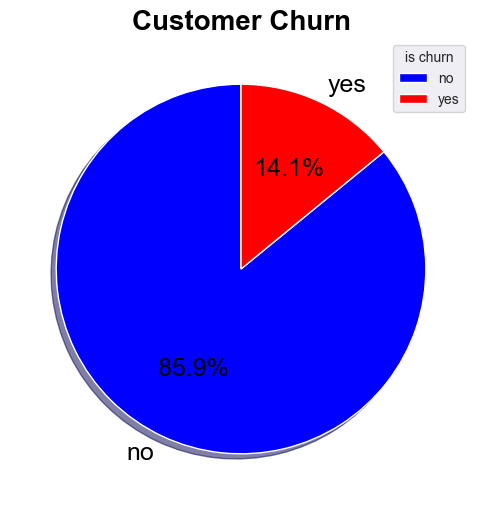

In [9]:
plt.figure(figsize=(9,6))
churn = df['churn'].value_counts()
colors = ['blue', 'red']
plt.pie(churn, labels=churn.index, autopct='%1.1f%%',
        startangle = 90, colors=colors, shadow=True,
        textprops=dict(color='black', fontsize=18))
plt.title("Customer Churn", color='black', loc='center', weight='bold', fontsize=20)
plt.legend(title='is churn')
plt.show()

In [10]:
def visual_category(df, col, **a):
  font_size1 = a.get('font_size1', 15)
  font_size2 = a.get('font_size2', 20)
  size_char = a.get('size_char', (8, 4))

  area = df.groupby([col, 'churn'])['account_length'].count().reset_index()
  area = area.pivot_table(index=col, columns='churn', values='account_length').fillna(0)
  area = area.sort_values(by='yes', ascending=False)

  fig, ax = plt.subplots(figsize=size_char)
  sns.barplot(x = area.index, y = area['yes'], color = 'red', label='yes', ax=ax)
  sns.barplot(x = area.index, y = area['no'], color = 'blue', label='no', bottom=area['yes'], ax=ax)

  for container in ax.containers:
    ax.bar_label(container, fontsize=font_size1, weight='bold', color='black', label_type = 'center')

  ax.bar_label(ax.containers[1], fontsize=font_size2, weight='bold', color='black')
  ax.legend(title='is churn')
  ax.set_xlabel(col.title().replace('_', ' '))
  ax.set_ylabel('Quantity')
  ax.set_title(col.title().replace('_', ' ') + ' : Customer Churn', fontsize=20, pad=40, weight='bold')
  plt.show()

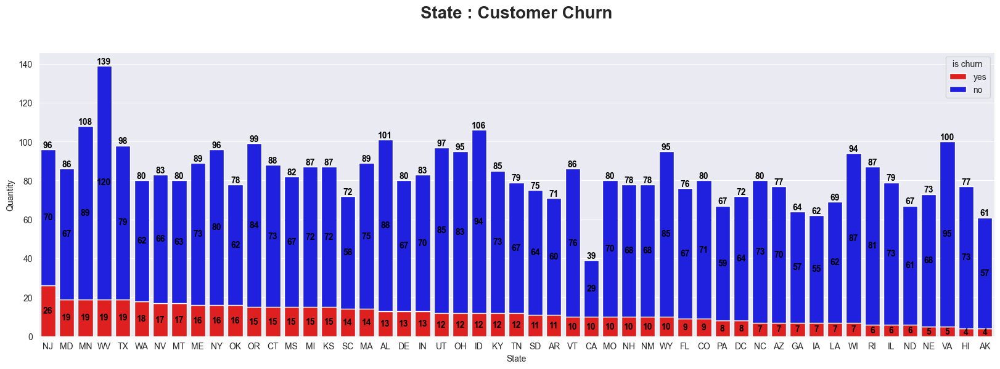

In [11]:
visual_category(df, 'state', font_size1 = 10, font_size2 = 10, size_char = (20, 6))

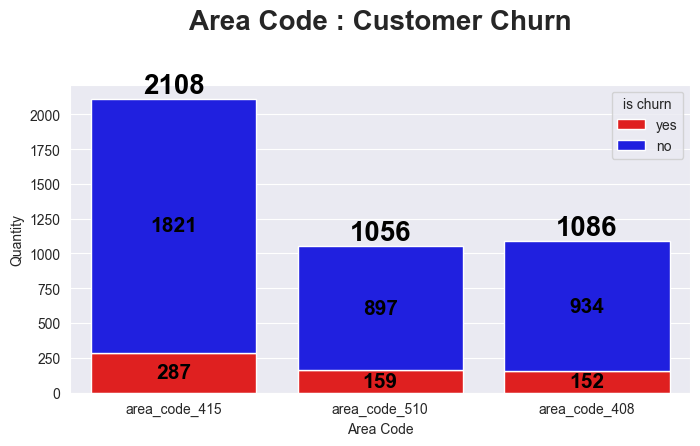

In [12]:
visual_category(df, 'area_code')

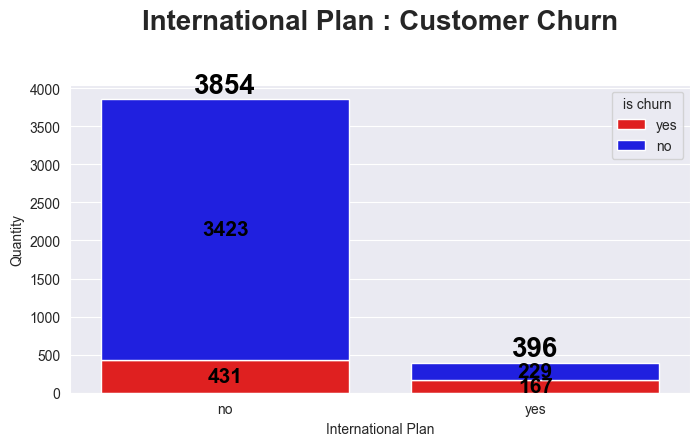

In [13]:
visual_category(df, 'international_plan')

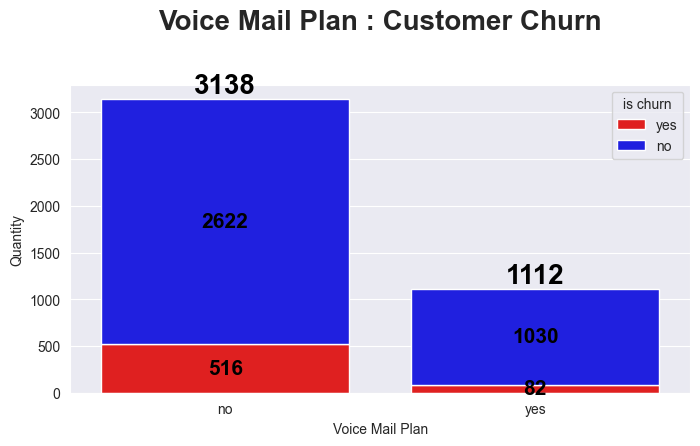

In [14]:
visual_category(df, 'voice_mail_plan')

<a id = "23"></a>
### 2.3. Phân tích mối quan hệ giữa các biến phân loại và biến mục tiêu (Yêu cầu thêm)

Cách 1: Gom nhóm bằng group by

In [3]:
df_grouped = df.groupby(['state', 'area_code', 'international_plan', 'voice_mail_plan', 'churn']).size().unstack(fill_value=0).reset_index()

df_grouped.columns.name = None
df_grouped.rename(columns={'no': 'count_no', 'yes': 'count_yes'}, inplace=True)
df_grouped['%churn'] = 100 * df_grouped['count_yes'] / (df_grouped['count_yes'] + df_grouped['count_no'])

In [5]:
df_sorted = df_grouped.sort_values(by='%churn', ascending=False).reset_index(drop=True)

df_sorted.head(10)

,state,area_code,international_plan,voice_mail_plan,count_no,count_yes,%churn
0,AL,area_code_408,yes,yes,0,1,100.00
1,AK,area_code_415,yes,no,0,1,100.00
2,MI,area_code_510,yes,yes,0,1,100.00
3,MN,area_code_415,yes,yes,0,2,100.00
4,NJ,area_code_510,yes,no,0,1,100.00
5,NH,area_code_415,yes,no,0,2,100.00
6,NJ,area_code_415,yes,no,0,2,100.00
7,AR,area_code_408,yes,yes,0,1,100.00
8,NH,area_code_510,yes,no,0,1,100.00
9,NH,area_code_510,yes,yes,0,1,100.00


Cách 2: Dùng decision tree để tìm các điều kiện

In [6]:
df_train = df[['state', 'area_code', 'international_plan', 'voice_mail_plan', 'churn']]
df_train = df_train.replace({'no': 0, 'yes': 1})
df_train['area_code'] = df_train['area_code'].astype(str).str[-3:]
df_train = pd.get_dummies(df_train, columns = ['state'], dtype = int)

In [7]:
X = df_train.drop(columns = ['churn'])
y = df_train['churn']

In [8]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

model = DecisionTreeClassifier(random_state=42)
model.fit(X, y)

DecisionTreeClassifier(random_state=42)

In [9]:
plt.figure(figsize=(200, 100))
plot_tree(model, feature_names=X.columns, class_names=['No Churn', 'Churn'], filled=True, rounded=True)
plt.title("Decision Tree Visualization")
plt.show()

In [ ]:
from sklearn.tree import export_graphviz
import graphviz
dot_data = export_graphviz(model, out_file=None,
                           feature_names=X.columns,
                           class_names=['No Churn', 'Churn'],
                           filled=True, rounded=True, special_characters=True)

graph = graphviz.Source(dot_data)
graph.render("decision_tree.pdf")  # Xuất ra file decision_tree.pdf

<a id = "24"></a>
### 2.4. Phân tích các biến liên tục

In [15]:
color_list = [
    'lightcoral',
    'lightseagreen',
    'springgreen',
    'deepskyblue',
    'gray',
    'violet',
    'brown',
    'lightcoral',
    'deeppink',
    'peru',
    'purple',
    'cyan',
    'forestgreen',
    'crimson',
    'magenta',
]

In [16]:
num_column = df.describe().columns.values

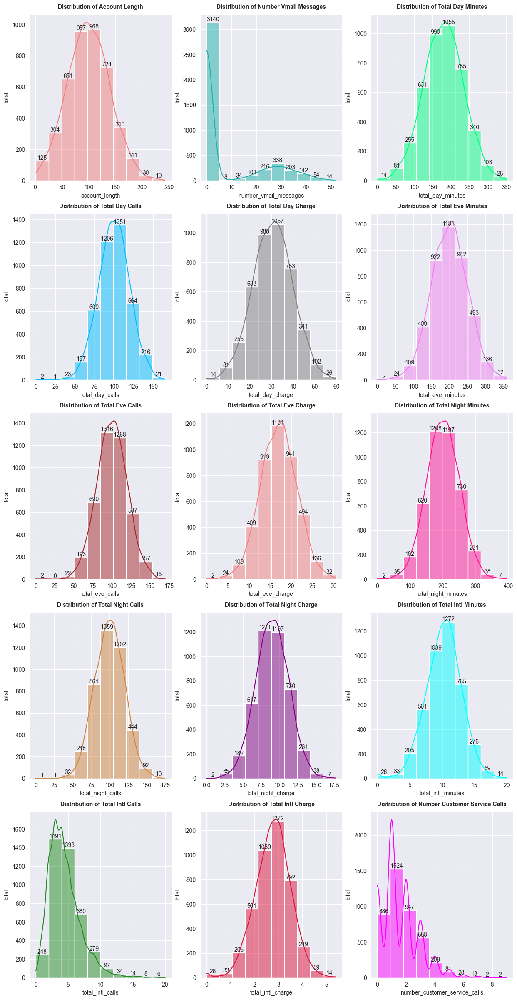

In [17]:
fig = plt.figure(figsize=[15,30])
for i ,col in enumerate(num_column):
    ax = fig.add_subplot(5, 3, i+1)
    ax = sns.histplot(df[col], bins=10, kde = True, color=color_list[i])
    ax.bar_label(ax.containers[0], fontsize=10)
    ax.set_xlabel(col, fontsize=10)
    ax.set_ylabel('total', fontsize=10)
    ax.tick_params(labelsize=10)
    title = col.title().replace('_', ' ')
    ax.set_title('Distribution of {}'.format(title), fontweight='bold', fontsize=10, pad=10)

* Các biến có phân bố chủ yếu theo phân phối chuẩn.
* Một số biến ngoại lệ `number_vmail_message`, `total_intl_calls`, `number_customer_service_calls` thì phân phối bị lệch sang bên trái

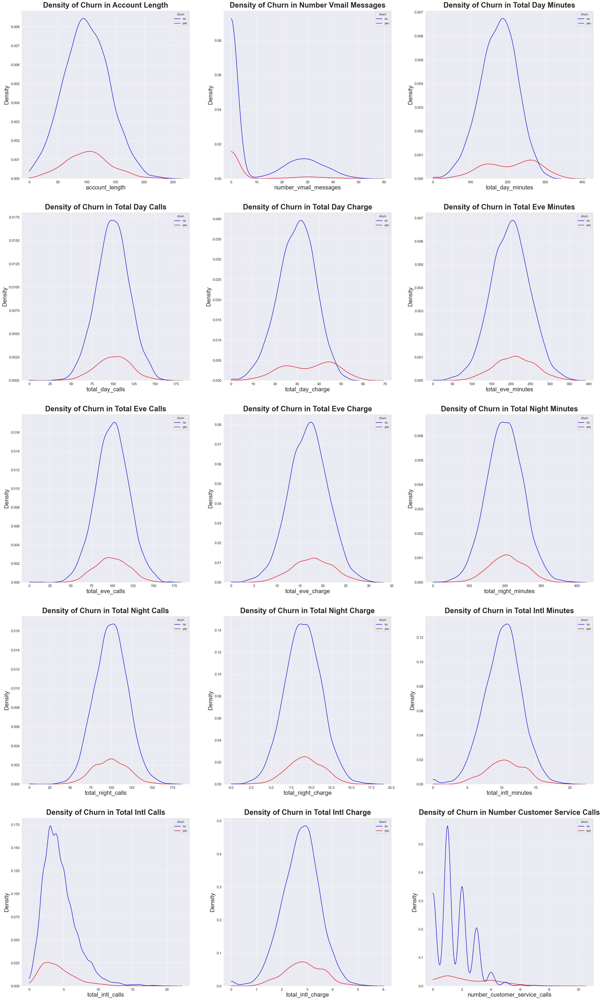

In [18]:
fig = plt.figure(figsize=[35,60])
for i ,col in enumerate(num_column):
    ax = fig.add_subplot(5, 3, i+1)
    ax = sns.kdeplot(data = df, x=col, hue='churn',  palette=['blue', 'red'], clip = (0, None))
    ax.set_xlabel(col, fontsize=20)
    ax.set_ylabel('Density', fontsize=20)
    ax.tick_params(labelsize=12)
    title = col.title().replace('_', ' ')
    ax.set_title('Density of Churn in {}'.format(title), fontweight='bold', fontsize=25, pad=10)

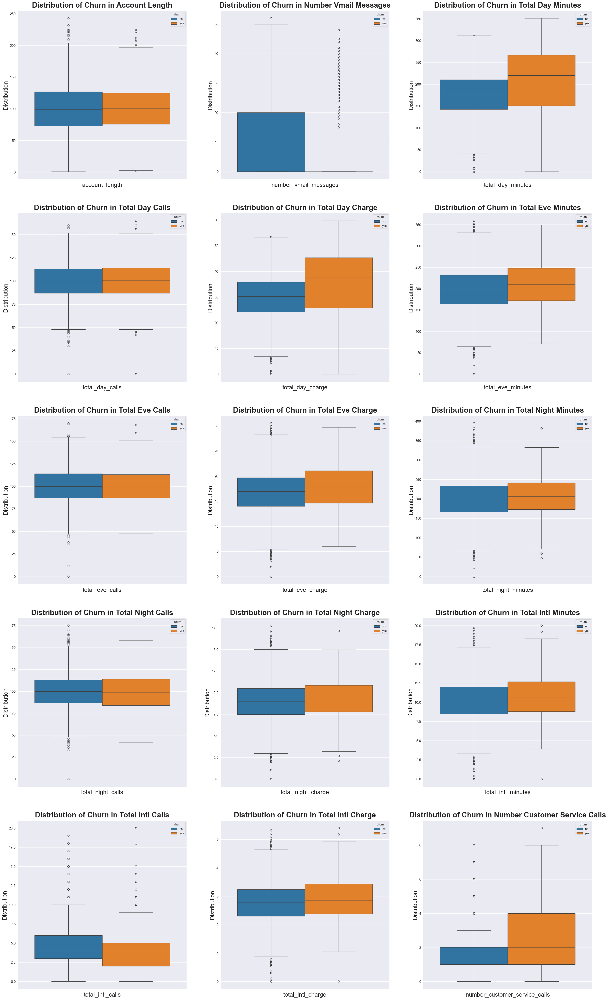

In [19]:
fig = plt.figure(figsize=[35,60])
for i ,col in enumerate(num_column):
    ax = fig.add_subplot(5, 3, i+1)
    ax = sns.boxplot(data = df, y=col, hue='churn')
    ax.set_xlabel(col, fontsize=20)
    ax.set_ylabel('Distribution', fontsize=20)
    ax.tick_params(labelsize=12)
    title = col.title().replace('_', ' ')
    ax.set_title('Distribution of Churn in {}'.format(title), fontweight='bold', fontsize=25, pad=10)

In [20]:
def visual_numberic(df, col, xlabel, n = 20):
  target_variable = [col, 'churn']

  fig, ax = plt.subplots(figsize=(15,7))
  sns.histplot(data=df, x=target_variable[0], bins=n, stat='count', hue=target_variable[1], multiple='stack', palette=['blue', 'red'], ax=ax)

  name_col = col.title().replace('_', ' ')
  ax.set_title('Distribution of {} : Customer Churn'.format(name_col), fontweight='bold', pad=20, fontsize=20)
  ax.tick_params(labelsize=12)
  ax.set_xlabel(xlabel, fontsize=12)
  ax.set_ylabel('Frequency', fontsize=12)
  ax.tick_params(labelsize=12)

  for container in ax.containers:
      ax.bar_label(container, label_type='edge', fontsize=15, weight='bold', padding=3, color='black')

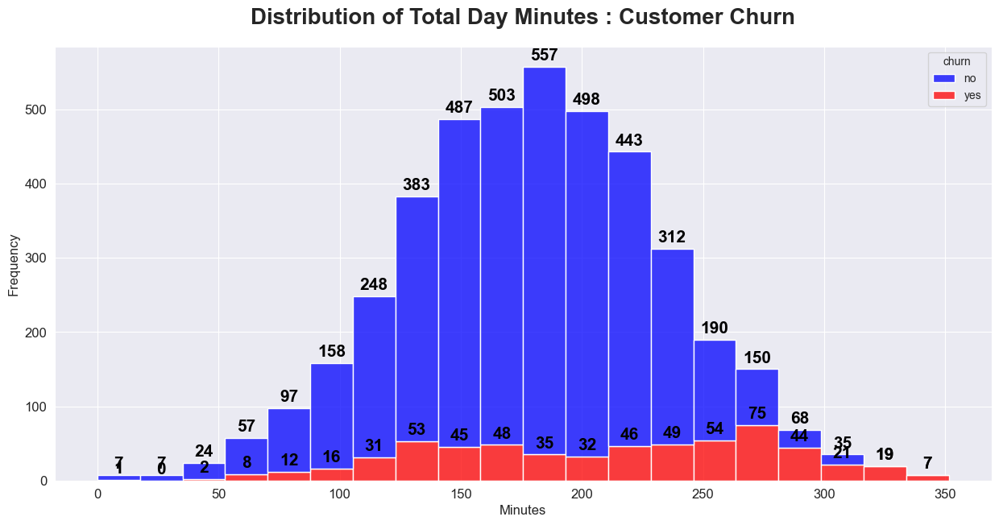

In [21]:
visual_numberic(df, 'total_day_minutes', 'Minutes')

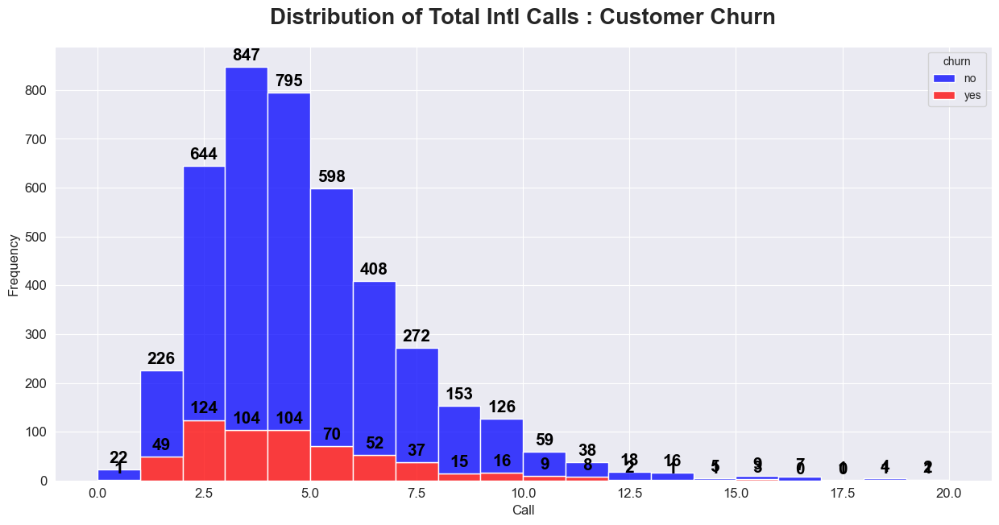

In [22]:
visual_numberic(df, 'total_intl_calls', 'Call')

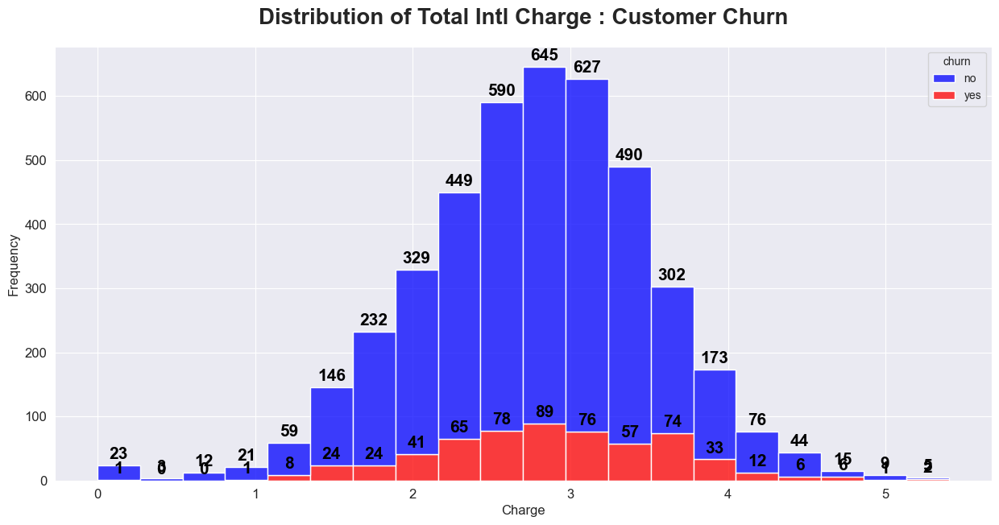

In [23]:
visual_numberic(df, 'total_intl_charge', 'Charge')

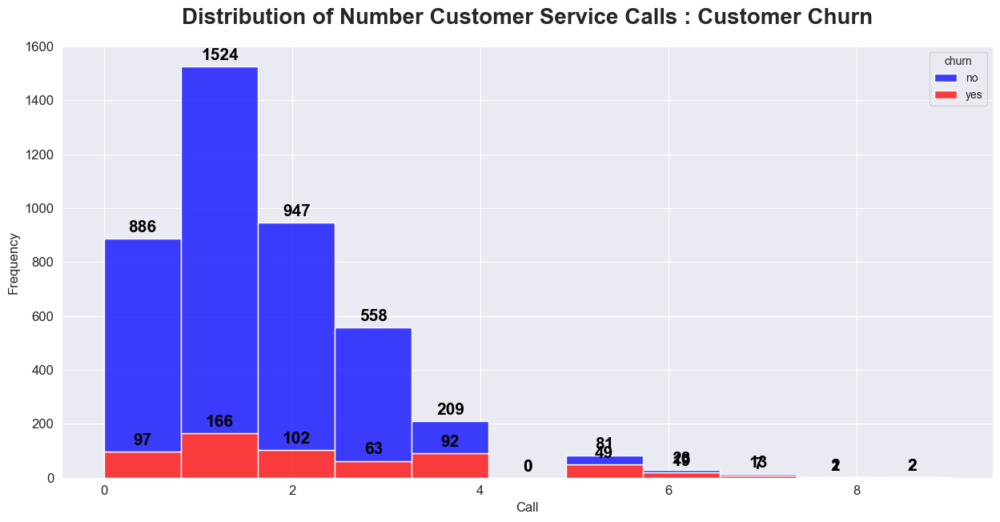

In [24]:
visual_numberic(df, 'number_customer_service_calls', 'Call', 11)

In [25]:
def visual_group(col, cat, xlabel = 'Minutes'):
  n = 10
  target_variable = [col, 'churn', cat]

  fig, ax = plt.subplots(1,2, figsize=(20,10))
  sns.histplot(data=df[df[target_variable[2]]=='yes'], x=target_variable[0], bins=n, stat='count', hue=target_variable[1], multiple='stack', palette=['blue', 'red'], ax=ax[0])
  ax[0].set_title('Distribution of {} with have {} (yes)'.format(target_variable[0], target_variable[2]), fontweight='bold', pad=20, fontsize=10)
  ax[0].set_xlabel(xlabel, fontsize=10)
  ax[0].set_ylabel('Frequncy', fontsize=10)
  ax[0].tick_params(labelsize=10)

  for container in ax[0].containers:
      ax[0].bar_label(container, label_type='edge', fontsize=15, weight='bold', padding=3, color='black')


  sns.histplot(data=df[df[target_variable[2]]=='no'], x=target_variable[0], bins=n, stat='count', hue=target_variable[1], multiple='stack', palette=['blue', 'red'], ax=ax[1])
  ax[1].set_title("Distribution of {} with don't have {} (no)".format(target_variable[0], target_variable[2]), fontweight='bold', pad=20, fontsize=10)
  ax[1].set_xlabel(xlabel, fontsize=10)
  ax[1].set_ylabel('Frequncy', fontsize=10)
  ax[1].tick_params(labelsize=10)
  for container in ax[1].containers:
      ax[1].bar_label(container, label_type='edge', fontsize=15, weight='bold', padding=3, color='black')

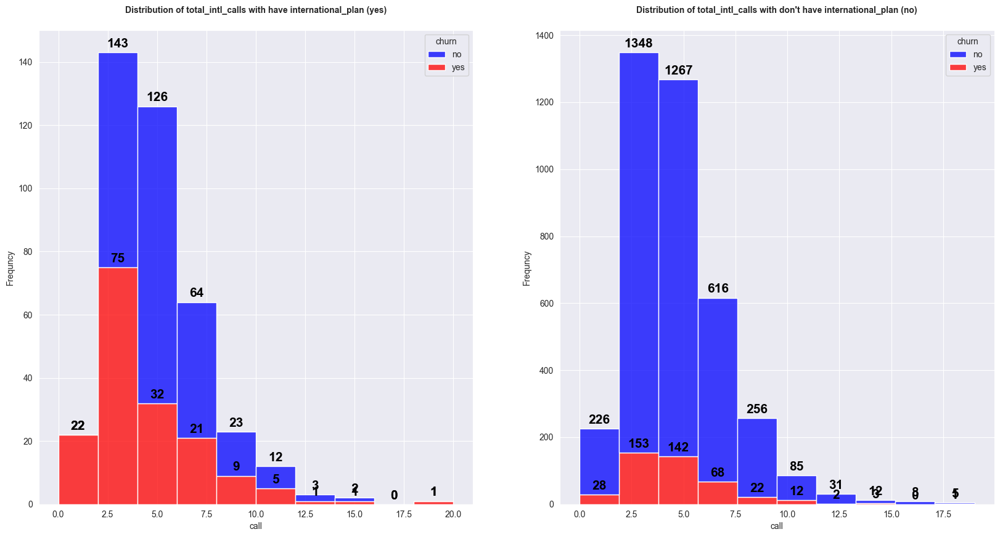

In [26]:
visual_group('total_intl_calls', 'international_plan', 'call')

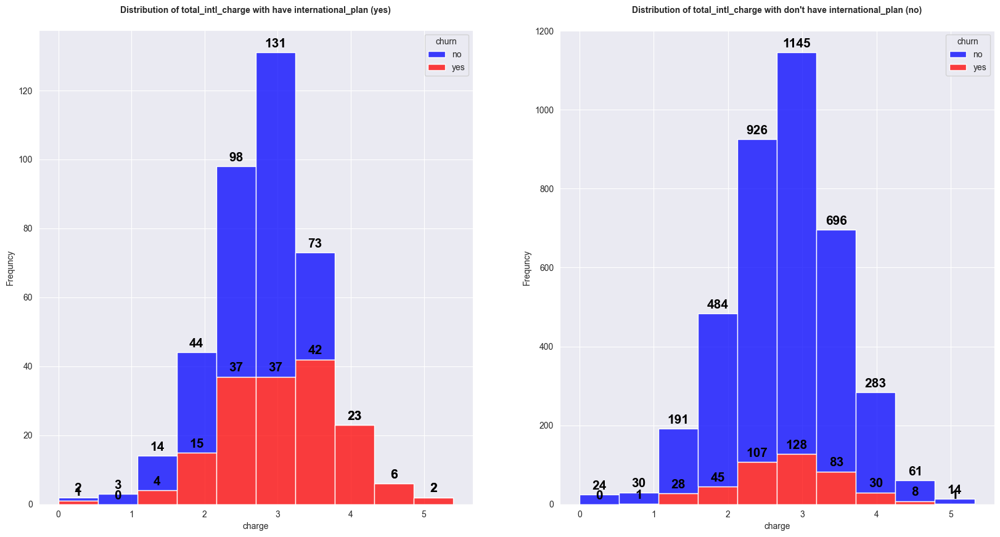

In [27]:
visual_group('total_intl_charge', 'international_plan', 'charge')

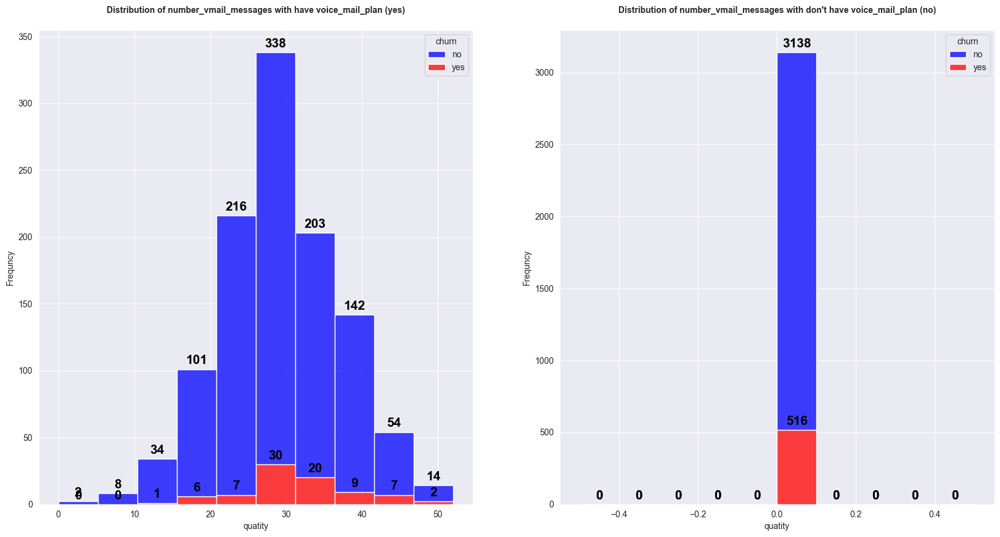

In [28]:
visual_group('number_vmail_messages', 'voice_mail_plan', 'quatity')

<a id = "3"></a>
## 3. Xử lý dữ liệu

In [29]:
def check_nan(df):
    print("Kiểm tra các cột chứa giá trị NaN:")
    nan_count = df.isna().sum()
    for col, count in nan_count.items():
      print("- " + col + ": " + str(count) + " giá trị NaN")


def check_duplicate(df):
    print("Kiểm tra các dòng bị lặp:")
    dup_count = df.duplicated().sum()
    print("Số dòng bị lặp: " + str(dup_count))


def check_outlier(df, cols):
    outlier_rows = pd.DataFrame()

    for col in cols:
      q1 = df[col].quantile(0.25)
      q3 = df[col].quantile(0.75)
      iqr = q3 - q1
      min = q1 - 1.5 * iqr
      max = q3 + 1.5 * iqr
      outliers = df[(df[col] < min) | (df[col] > max)]
      count_outliers = len(outliers)
      print("Số giá trị ngoại lệ của cột " + col + ": " + str(count_outliers))

      outlier_rows = pd.concat([outlier_rows, outliers])

    outlier_rows = outlier_rows.drop_duplicates()
    return outlier_rows

def handle_outlier(df, cols):
    for col in cols:
      Q1 = df[col].quantile(0.25)
      Q3 = df[col].quantile(0.75)
      IQR = Q3 - Q1
      min = Q1 - (IQR * 1.5)
      max = Q3 + (IQR * 1.5)
      df[col] = np.where(df[col] < min, min, df[col])
      df[col] = np.where(df[col] > max, max, df[col])

    return df

def visualization_outlier(df, cols):

    fig = plt.figure(figsize=[20,40])
    for i ,col in enumerate(cols):
      ax = fig.add_subplot(6,3, i+1)
      ax = sns.boxplot(data = df, y=col)
      title = col.title().replace('_', ' ')
      ax.set_title(title)
      ax.set_xlabel(col)

<a id = "31"></a>
### 3.1. Xử lý dữ liệu thiếu và lặp

In [30]:
check_nan(df)

Kiểm tra các cột chứa giá trị NaN:
- state: 0 giá trị NaN
- account_length: 0 giá trị NaN
- area_code: 0 giá trị NaN
- international_plan: 0 giá trị NaN
- voice_mail_plan: 0 giá trị NaN
- number_vmail_messages: 0 giá trị NaN
- total_day_minutes: 0 giá trị NaN
- total_day_calls: 0 giá trị NaN
- total_day_charge: 0 giá trị NaN
- total_eve_minutes: 0 giá trị NaN
- total_eve_calls: 0 giá trị NaN
- total_eve_charge: 0 giá trị NaN
- total_night_minutes: 0 giá trị NaN
- total_night_calls: 0 giá trị NaN
- total_night_charge: 0 giá trị NaN
- total_intl_minutes: 0 giá trị NaN
- total_intl_calls: 0 giá trị NaN
- total_intl_charge: 0 giá trị NaN
- number_customer_service_calls: 0 giá trị NaN
- churn: 0 giá trị NaN


In [31]:
check_duplicate(df)

Kiểm tra các dòng bị lặp:
Số dòng bị lặp: 0


<a id = "32"></a>
### 3.2. Xử lý dữ liệu ngoại lệ

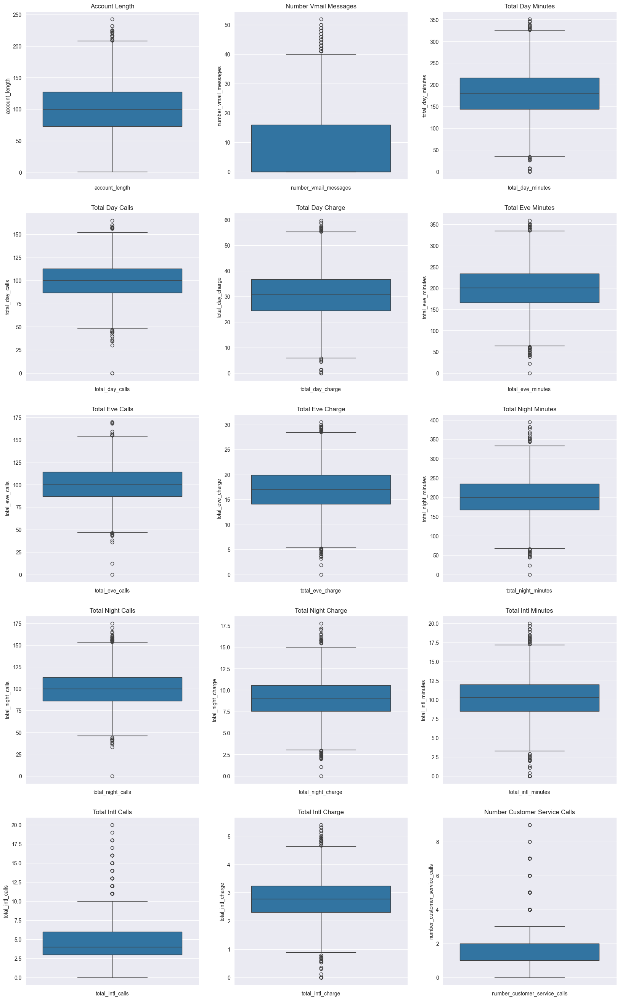

In [32]:
visualization_outlier(df, num_column)

In [33]:
outliers = check_outlier(df, num_column)

Số giá trị ngoại lệ của cột account_length: 20
Số giá trị ngoại lệ của cột number_vmail_messages: 86
Số giá trị ngoại lệ của cột total_day_minutes: 25
Số giá trị ngoại lệ của cột total_day_calls: 28
Số giá trị ngoại lệ của cột total_day_charge: 26
Số giá trị ngoại lệ của cột total_eve_minutes: 34
Số giá trị ngoại lệ của cột total_eve_calls: 24
Số giá trị ngoại lệ của cột total_eve_charge: 34
Số giá trị ngoại lệ của cột total_night_minutes: 37
Số giá trị ngoại lệ của cột total_night_calls: 33
Số giá trị ngoại lệ của cột total_night_charge: 37
Số giá trị ngoại lệ của cột total_intl_minutes: 62
Số giá trị ngoại lệ của cột total_intl_calls: 100
Số giá trị ngoại lệ của cột total_intl_charge: 62
Số giá trị ngoại lệ của cột number_customer_service_calls: 335


In [34]:
churn_outliers = outliers['churn'].value_counts()
churn_total = df['churn'].value_counts()

<Figure size 600x400 with 0 Axes>

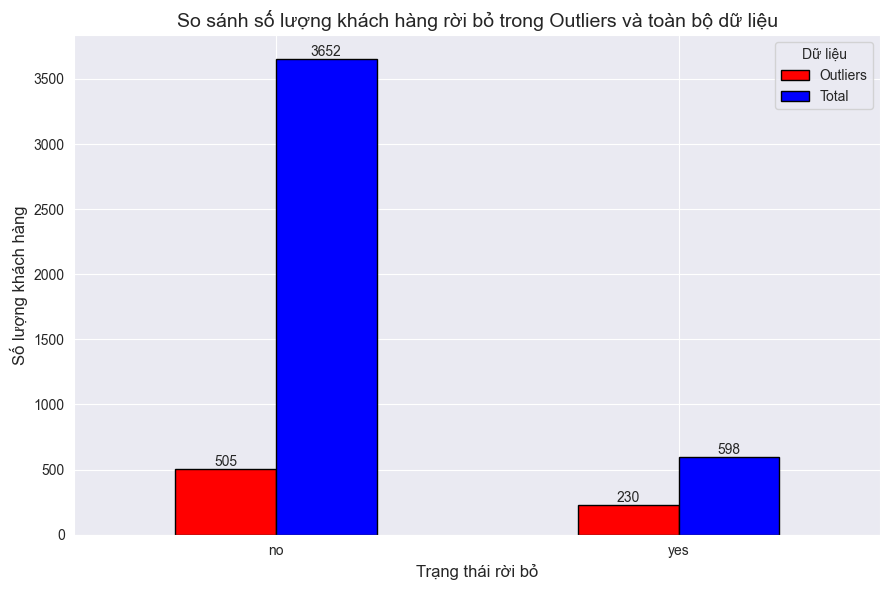

In [35]:
comparison_df = pd.DataFrame({
    'Outliers': churn_outliers,
    'Total': churn_total
})

plt.figure(figsize=(6, 4))
ax = comparison_df.plot(kind='bar', figsize=(9, 6), color=['red', 'blue'], edgecolor='black')

for container in ax.containers:
    ax.bar_label(container)

plt.title('So sánh số lượng khách hàng rời bỏ trong Outliers và toàn bộ dữ liệu', fontsize=14)
plt.ylabel('Số lượng khách hàng', fontsize=12)
plt.xlabel('Trạng thái rời bỏ', fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Dữ liệu', fontsize=10)


# Hiển thị biểu đồ
plt.tight_layout()
plt.show()

Thay thế các ngoại lệ

In [36]:
df = handle_outlier(df, num_column)

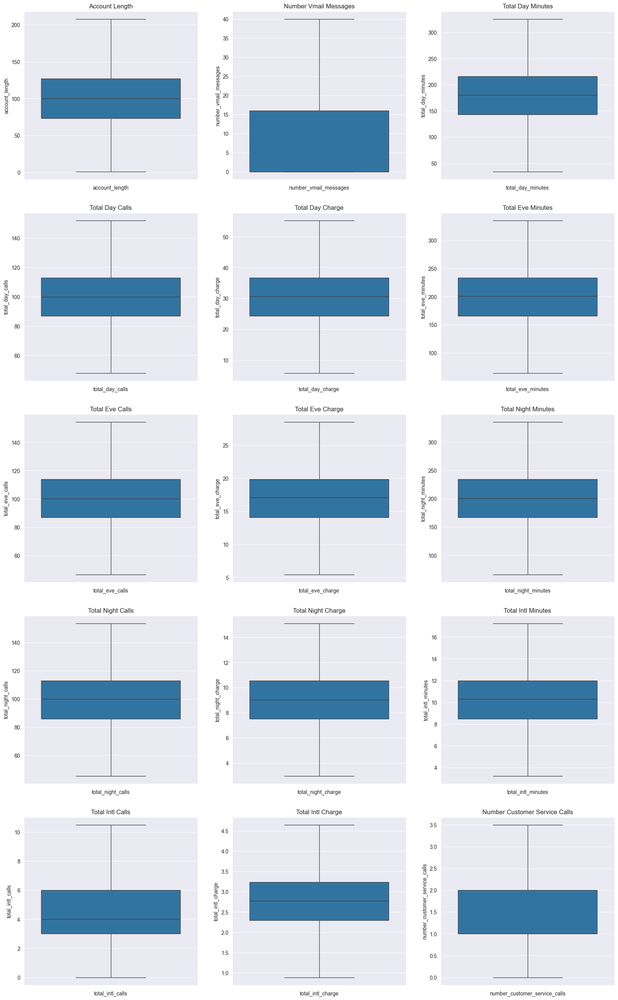

In [37]:
visualization_outlier(df, num_column)

<a id = "4"></a>
## 4. Chuẩn bị dữ liệu

<a id = "41"></a>
### 4.1. Kiểm tra tương quan

Kiểm tra mối tương quan giữa các biến phân loại với biến mục tiêu

In [38]:
def chi_squared_analysis(df, categorical_columns, target_variable):
    """
    Phân tích Chi-squared giữa biến mục tiêu (phân loại) và các biến phân loại khác.

    :param df: DataFrame chứa dữ liệu.
    :param target_variable: Tên cột của biến mục tiêu (phân loại).
    :results: Kết quả của phân tích Chi-squared cho từng biến phân loại.
    """
    results = []

    for col in categorical_columns:
        # Tạo bảng tần suất giữa biến mục tiêu và biến phân loại
        contingency_table = pd.crosstab(df[target_variable], df[col])

        # Tính toán Chi-squared
        chi2, p, dof, expected = statas.chi2_contingency(contingency_table)

        results.append({'Tên biến': col, 'chi2_statistic': chi2,
                        'p-value': p,
                        'Có ý nghĩa?': True if p < 0.05 else False})

    result_df = pd.DataFrame(results)
    result_df = result_df.sort_values(
        by=['chi2_statistic', 'p-value'], ascending=[False, True]).reset_index(drop=True)

    return result_df

In [39]:
cate_col = ['area_code', 'state', 'international_plan', 'voice_mail_plan']

In [40]:
chi_squared_analysis(df, cate_col, 'churn')

,Tên biến,chi2_statistic,p-value,Có ý nghĩa?
0,international_plan,282.65,0.00,True
1,state,85.99,0.00,True
2,voice_mail_plan,55.11,0.00,True
3,area_code,1.22,0.54,False


Kiểm tra mối quan hệ của các biến liên tục với biến mục tiêu

In [41]:
from scipy.stats import f_oneway

def anova_analysis(df, num_cols, target_variable):
    """
    Phân tích ANOVA giữa biến mục tiêu phân loại và các biến số liên tục.

    :param df: DataFrame chứa dữ liệu.
    :param target_variable: Tên cột của biến mục tiêu (phân loại).
    :param num_cols: Danh sách các biến số liên tục.
    :results: Kết quả của phân tích ANOVA cho từng biến số liên tục.
    """
    results = []

    # Lặp qua từng biến số liên tục
    for col in num_cols:
        # Tạo danh sách các nhóm cho ANOVA dựa trên biến phân loại
        group1 = df[df[target_variable] == 'no'][col]  # Nhóm không bị churn
        group2 = df[df[target_variable] == 'yes'][col]  # Nhóm bị churn

        # Thực hiện kiểm định ANOVA
        f_statistic, p_value = f_oneway(group1, group2)

        results.append({
            'Tên biến': col,
            'F_statistic': f_statistic,
            'p_value': p_value,
            'Có ý nghĩa?': True if p_value < 0.05 else False  # Kiểm tra độ tin cậy ở mức alpha = 0.05
        })

    result_df = pd.DataFrame(results)
    result_df = result_df.sort_values(
        by=['F_statistic', 'p_value'], ascending=[False, True]).reset_index(drop=True)

    return result_df

In [42]:
anova_analysis(df, num_column, 'churn')

,Tên biến,F_statistic,p_value,Có ý nghĩa?
0,total_day_minutes,205.58,0.00,True
1,total_day_charge,205.55,0.00,True
2,number_customer_service_calls,121.38,0.00,True
3,number_vmail_messages,44.28,0.00,True
4,total_eve_minutes,26.36,0.00,True
5,total_eve_charge,26.36,0.00,True
6,total_intl_minutes,12.25,0.00,True
7,total_intl_charge,12.23,0.00,True
8,total_night_minutes,9.41,0.00,True
9,total_night_charge,9.41,0.00,True


<a id = "42"></a>
### 4.2. Lựa chọn thuộc tính

Các thuộc tính hữu ích:
- total_day_minutes
-	total_day_charge
-	number_customer_service_calls
-	number_vmail_messages
-	total_eve_minutes
-	total_eve_charge
-	total_intl_minutes
-	total_intl_charge
-	total_night_minutes
-	total_night_charge
-	total_intl_calls
- international_plan
-	state
-	voice_mail_plan

Kiểm tra đa cộng tuyến

<Axes: >

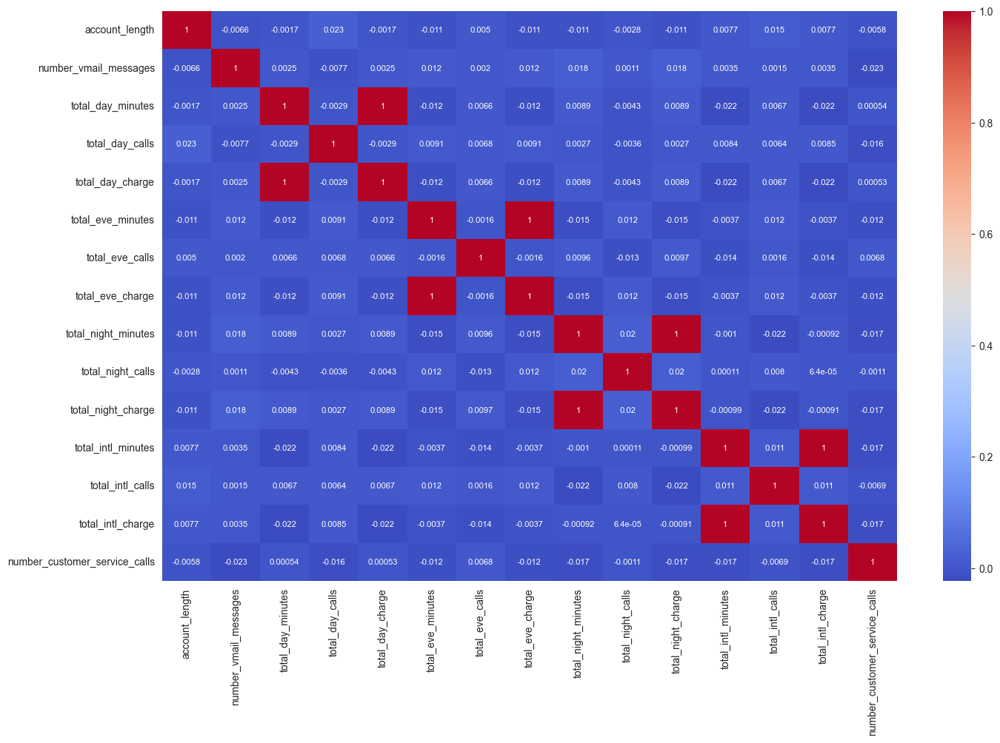

In [43]:
correlation_matrix = df[num_column].corr()
plt.figure(figsize=(16, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', annot_kws={"size": 8})

Các biến có mối tương quan với nhau là:
- total_day_minutes và total_day_charge
- total_eve_minutes và total_eve_charge
- total_night_minutes và total_night_charge
- total_intl_minutes và total_intl_charge

Các biến sử dụng là:
- total_day_minutes
-	number_customer_service_calls
-	number_vmail_messages
-	total_eve_minutes
-	total_intl_minutes
-	total_night_minutes
-	total_intl_calls
- international_plan
-	state
-	voice_mail_plan

<a id ='43'></a>
### 4.3. Tạo Feature

Các feature mới

In [44]:
df['total_minutes/total_calls'] = (df['total_day_minutes'] + df['total_eve_minutes'] + df['total_night_minutes']) / (df['total_day_calls'] + df['total_eve_calls'] + df['total_night_calls'])
df_test['total_minutes/total_calls'] = (df_test['total_day_minutes'] + df_test['total_eve_minutes'] + df_test['total_night_minutes']) / (df_test['total_day_calls'] + df_test['total_eve_calls'] + df_test['total_night_calls'])

In [45]:
anova_analysis(df, ['total_minutes/total_calls'], 'churn')

,Tên biến,F_statistic,p_value,Có ý nghĩa?
0,total_minutes/total_calls,113.18,0.00,True


In [46]:
col_train = ['number_customer_service_calls',
             'number_vmail_messages',
             'total_intl_minutes',
             'total_minutes/total_calls',
             'state',
             'voice_mail_plan',
             'international_plan',
             'churn']

df = df[col_train]
df_test = df_test[col_train]

<a id = "44"></a>
### 4.4. Mã hóa dữ liệu phân loại

In [47]:
import category_encoders as ce

def label_encoding(df_train, df_test, cols):
    for col in cols:
      df_train[col] = df_train[col].map({'yes':1, 'no':0})
      df_test[col] = df_test[col].map({'yes':1, 'no':0})
    return df_train, df_test

def hash_encoding(df_train, df_test, cols):
    encoder = ce.HashingEncoder(cols=cols)
    df_train = encoder.fit_transform(df_train)
    df_test = encoder.transform(df_test)
    return df_train, df_test


Label encoding cho 'international_plan', 'voice_mail_plan', 'churn'

In [48]:
df, df_test  = label_encoding(df, df_test, ['international_plan', 'voice_mail_plan', 'churn'])

Dùng Hash encoding cho cột state

In [49]:
df, df_test = hash_encoding(df, df_test, ['state'])

Chuẩn hóa dữ liệu về cùng 1 miền

In [50]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
col_train = df.columns
df[col_train] = scaler.fit_transform(df[col_train])
df_test[col_train] = scaler.transform(df_test[col_train])

Sau khi chuyển các cột về dạng số, kiểm tra tương quan một lần nữa với biến churn, ta có thể thấy cách các biến ảnh hưởng đến biến mục tiêu. Các cột màu xanh ảnh hưởng tích cực - nghĩa là khi nó tăng sẽ kéo biến mục tiêu tăng, ngược lại với các cột đỏ.

In [51]:
def corr_churn(df):
  num = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

  churn_corr = df[num].corr()['churn'].reset_index().rename(columns={'index':'variable', 'churn':'correlation'})
  churn_corr = churn_corr[churn_corr['variable'] != 'churn']

  fig, ax = plt.subplots(figsize=(30,15))

  # Phân loại màu sắc
  churn_corr['color'] = ['positive' if value > 0 else 'negative' for value in churn_corr['correlation']]
  churn_corr['color'] = churn_corr['color'].map({'positive': 'blue', 'negative': 'red'})

  b = ax.barh(churn_corr['variable'], churn_corr['correlation'], color=churn_corr['color'])
  ax.bar_label(b, fmt='%.2f', padding=5, color='black', fontsize=20)
  ax.tick_params(axis='both', labelsize=15)
  plt.ylabel('Độ tương quan',fontsize=15 )
  plt.xlabel('Biến',fontsize=15)
  plt.title('Tương quan của churn với các biến', fontsize=15)


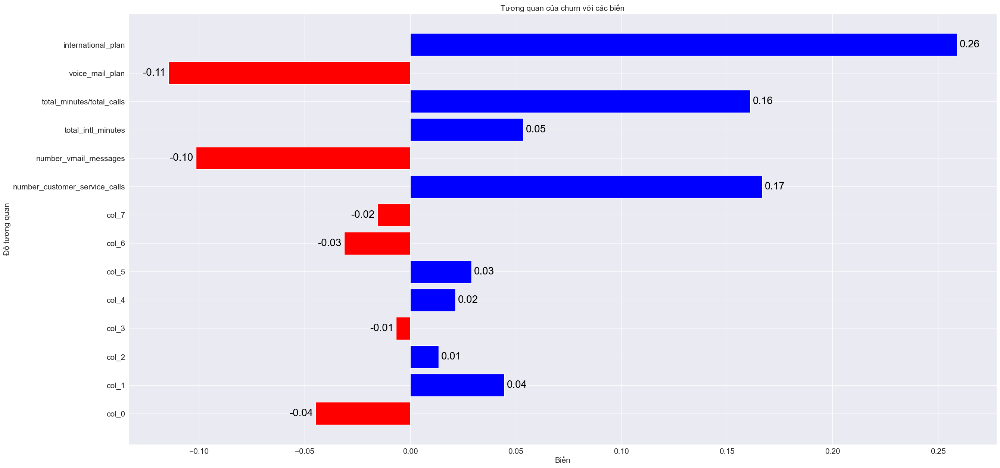

In [52]:
corr_churn(df)

<a id = "45"></a>
### 4.5. Phân chia dữ liệu

In [53]:
X_train = df.drop(columns=['churn'])
y_train = df['churn']
X_test = df_test.drop(columns=['churn'])
y_test = df_test['churn']

In [54]:
X_train.head()

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,number_customer_service_calls,number_vmail_messages,total_intl_minutes,total_minutes/total_calls,voice_mail_plan,international_plan
0,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.29,0.65,0.75,0.37,1.00,0.00
1,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.64,0.28,0.00,0.00
2,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.57,0.00,0.24,0.51,0.00,1.00
3,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.86,0.00,0.49,0.22,0.00,1.00
4,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.86,0.60,0.30,0.57,1.00,0.00


<a id = "5"></a>
## 5. Huấn luyện và đánh giá

In [55]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, ConfusionMatrixDisplay

In [56]:
class ModelTrain:
  X_train = X_train
  X_test = X_test
  y_train = y_train
  y_test = y_test
  def __init__(self, model):
    self.model= model
  def find_best_params(self, param_grid):
        grid_search = GridSearchCV(self.model, param_grid, scoring='accuracy', cv=5, n_jobs=-1)
        grid_search.fit(ModelTrain.X_train, ModelTrain.y_train)
        self.model = grid_search.best_estimator_
        print(f"Best Parameters: {grid_search.best_params_}")
        print(f"Best Score: {grid_search.best_score_}")
  def fit(self):
    self.model.fit(ModelTrain.X_train, ModelTrain.y_train)
  def predit(self):
    self.y_pred = self.model.predict(ModelTrain.X_test)
    return self.y_pred
  def visual_matris_confision(self):
    print(classification_report(ModelTrain.y_test, self.y_pred))
    ConfusionMatrixDisplay.from_predictions(ModelTrain.y_test, self.y_pred, display_labels=['no churn', 'churn'])

<a id = "51"></a>
### 5.1. Decision Tree

Best Parameters: {'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 2}
Best Score: 0.7927058823529411
              precision    recall  f1-score   support

         0.0       0.61      0.72      0.66       463
         1.0       0.36      0.25      0.30       287

    accuracy                           0.54       750
   macro avg       0.49      0.49      0.48       750
weighted avg       0.52      0.54      0.52       750



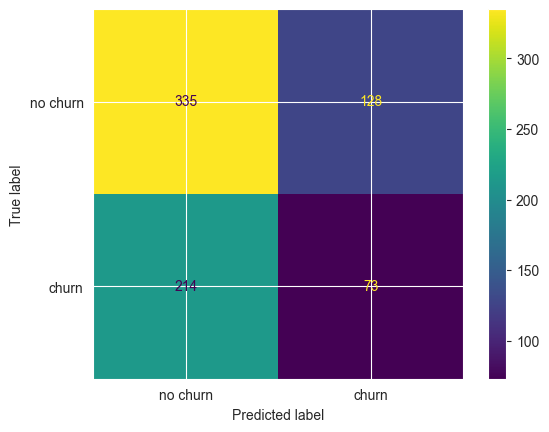

In [57]:
dt_model = ModelTrain(DecisionTreeClassifier())
param_grid_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [5, 10],
    'class_weight': ['balanced']
}
dt_model.find_best_params(param_grid_dt)
dt_model.fit()
dt_model.predit()
dt_model.visual_matris_confision()

<a id = "52"></a>
### 5.2. Logistic Regression

Best Parameters: {'C': 1, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'lbfgs'}
Best Score: 0.7296470588235294
              precision    recall  f1-score   support

         0.0       0.61      0.63      0.62       463
         1.0       0.37      0.35      0.36       287

    accuracy                           0.53       750
   macro avg       0.49      0.49      0.49       750
weighted avg       0.52      0.53      0.52       750



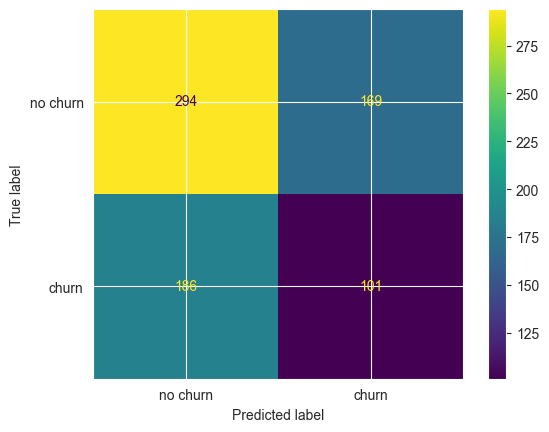

In [58]:
lg_model = ModelTrain(LogisticRegression())
param_grid_logistic = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l2', 'none'],
    'solver': ['lbfgs', 'saga'],
    'class_weight': ['balanced'],
}
lg_model.find_best_params(param_grid_logistic)
lg_model.fit()
lg_model.predit()
lg_model.visual_matris_confision()

<a id = "53"></a>
### 5.3. Support Vector Machine

Best Parameters: {'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf', 'probability': True}
Best Score: 0.74
              precision    recall  f1-score   support

         0.0       0.61      0.65      0.63       463
         1.0       0.36      0.31      0.34       287

    accuracy                           0.52       750
   macro avg       0.48      0.48      0.48       750
weighted avg       0.51      0.52      0.52       750



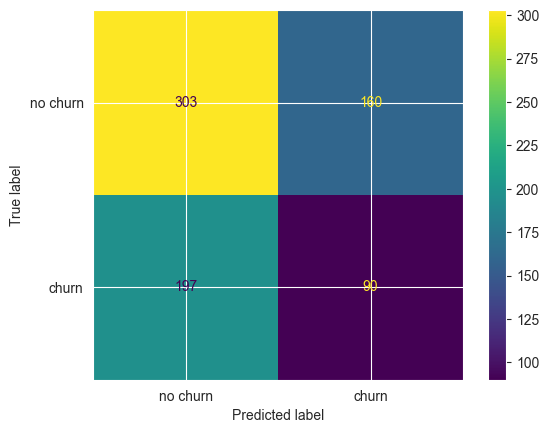

In [59]:
svm_model = ModelTrain(SVC())
param_grid_svm = {
    'kernel': ['rbf', 'sigmoid'],
    'gamma': [None, 'scale'],
    'probability': [True, False],
    'class_weight': ['balanced']
}
svm_model.find_best_params(param_grid_svm)
svm_model.fit()
svm_model.predit()
svm_model.visual_matris_confision()